In [ ]:
DATA ANALYSIS LEVEL 2

In [ ]:
TASK 1 : Restaurant Ratings

In [19]:
import pandas as pd

In [20]:
restaurants_data = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

In [21]:
restaurants_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [22]:
rating_counts = pd.cut(restaurants_data['Aggregate rating'], bins=[0, 1, 2, 3, 4, 5, 6, 7], include_lowest=True).value_counts().sort_index()
most_common_range = rating_counts.idxmax()
average_votes = restaurants_data['Votes'].mean()

In [23]:
print("Distribution of Ratings:")
print(rating_counts)

print("\nMost Common Rating Range:", most_common_range)
print("\nAverage Number of Votes Received by Restaurants:", average_votes)

Distribution of Ratings:
Aggregate rating
(-0.001, 1.0]    2148
(1.0, 2.0]         10
(2.0, 3.0]       1891
(3.0, 4.0]       4388
(4.0, 5.0]       1114
(5.0, 6.0]          0
(6.0, 7.0]          0
Name: count, dtype: int64

Most Common Rating Range: (3.0, 4.0]

Average Number of Votes Received by Restaurants: 156.909747670401


In [ ]:
TASK 2 : Cuisine Combination

In [54]:
import pandas as pd

In [55]:
restaurants_data = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

In [56]:
restaurants_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [57]:
cuisine_df = restaurants_data['Cuisines'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True).rename('Cuisine')

restaurants_data_split = restaurants_data.drop('Cuisines', axis=1).join(cuisine_df)

common_combinations = restaurants_data_split.groupby(restaurants_data_split.columns.tolist()).size().reset_index().rename(columns={0:'Frequency'})

common_combinations = common_combinations.sort_values(by='Frequency', ascending=False)

In [58]:
print("Most Common Cuisine Combinations:")
print(common_combinations)

average_ratings = restaurants_data_split.groupby('Cuisine')['Aggregate rating'].mean().sort_values(ascending=False)

print("\nAverage Ratings for Each Cuisine:")
print(average_ratings)

Most Common Cuisine Combinations:
       Restaurant ID                 Restaurant Name  Country Code       City  \
9500         2700007  Kaveri Restaurant And Caterers             1     Ranchi   
18156       18439535                         Pitstop             1      Noida   
9526         2700085  Kaveri Restaurant And Caterers             1     Ranchi   
18422       18446404                         Chokola             1    Gurgaon   
16406       18384142                   Crudo Juicery             1    Gurgaon   
...              ...                             ...           ...        ...   
6567          307054                  Dunkin' Donuts             1  New Delhi   
6566          307054                  Dunkin' Donuts             1  New Delhi   
6565          307054                  Dunkin' Donuts             1  New Delhi   
6564          307043                         Outback             1    Gurgaon   
19704       18500652                 Mahek By Greenz             1    Gurga

In [ ]:
TASK 3 : Geographic Analysis

In [24]:
import pandas as pd
import folium 
from folium.plugins import MarkerCluster
from sklearn.cluster import KMeans

In [25]:
restaurants = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

In [26]:
restaurants

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [27]:
restaurants = restaurants.rename(columns={'lat': 'Latitude', 'lon': 'Longitude'})

map_restaurants = folium.Map(location=[restaurants['Latitude'].mean(), restaurants['Longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(map_restaurants)

In [28]:
for idx, row in restaurants.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)


map_restaurants

In [59]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import DBSCAN

In [60]:
data = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

In [61]:
long_column = [col for col in data.columns if 'long' in col.lower()]
lat_column = [col for col in data.columns if 'lat' in col.lower()]

if long_column and lat_column:
    long_column_name = long_column[0]
    lat_column_name = lat_column[0]

    restaurant_map = folium.Map(location=[data[lat_column_name].mean(), data[long_column_name].mean()], zoom_start=12)
    markers = MarkerCluster(name='Restaurant Locations').add_to(restaurant_map)


    for _, row in data.iterrows():
        folium.Marker([row[lat_column_name], row[long_column_name]]).add_to(markers)

    X = data[[lat_column_name, long_column_name]].values
    eps = 0.01  
    min_samples = 5  
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(X)
    data['cluster'] = clusters

    cluster_colors = {-1: '#808080'}

 
    folium.LayerControl().add_to(restaurant_map)

    restaurant_map

    print("Number of clusters:", len(set(clusters)) - (1 if -1 in clusters else 0))
    print("Cluster sizes:")
    print(data['cluster'].value_counts())
else:
    print("No columns found for longitude and latitude.")

Number of clusters: 97
Cluster sizes:
cluster
 64    4150
 45    1630
 47    1008
-1      937
 23     497
       ... 
 49       5
 55       5
 70       5
 61       5
 96       5
Name: count, Length: 98, dtype: int64


In [ ]:
TASK 4 : Restaurant Chains

In [62]:
import pandas as pd

In [63]:
data = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

In [64]:
data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [65]:
if 'Restaurant Name' in data.columns:

    data['Restaurant Name'] = data['Restaurant Name'].str.lower()

    name_counts = data['Restaurant Name'].value_counts()

    potential_chains = name_counts[name_counts > 1]

    if not potential_chains.empty:
        print("Potential restaurant chains found:")
        for name, count in potential_chains.items():
            print(f"{count} locations of {name.title()}")
    else:
        print("No potential restaurant chains found in the dataset.")
else:
    print("The 'Restaurant Name' column is not present in the dataset.")

Potential restaurant chains found:
83 locations of Cafe Coffee Day
79 locations of Domino'S Pizza
63 locations of Subway
51 locations of Green Chick Chop
48 locations of Mcdonald'S
34 locations of Keventers
30 locations of Pizza Hut
29 locations of Giani
28 locations of Baskin Robbins
26 locations of Barbeque Nation
22 locations of Barista
22 locations of Giani'S
22 locations of Dunkin' Donuts
20 locations of Pind Balluchi
20 locations of Costa Coffee
19 locations of Pizza Hut Delivery
19 locations of Sagar Ratna
19 locations of Wah Ji Wah
19 locations of Twenty Four Seven
18 locations of Kfc
18 locations of Republic Of Chicken
18 locations of Starbucks
18 locations of Chaayos
16 locations of Haldiram'S
16 locations of Burger King
15 locations of Shree Rathnam
14 locations of Bikanervala
14 locations of Aggarwal Sweets
14 locations of Moti Mahal Delux
14 locations of Frontier
13 locations of Behrouz Biryani
13 locations of Karim'S
13 locations of Bikaner Sweets
12 locations of 34, Chow

In [66]:
import pandas as pd
import matplotlib.pyplot as plt

In [67]:
data = pd.read_csv(r"C:\Users\janani\OneDrive\Documents\Dataset .csv")

Potential restaurant chains found:
10 Downing Street has 2 locations with an average rating of 4.00
221 B Baker Street has 3 locations with an average rating of 3.37
34 Parkstreet Lane has 2 locations with an average rating of 3.05
34, Chowringhee Lane has 12 locations with an average rating of 2.79
4700Bc Popcorn has 2 locations with an average rating of 3.50
6 Pack Momos has 2 locations with an average rating of 1.40
A Piece Of Paris has 2 locations with an average rating of 3.75
Aap Ki Khatir has 2 locations with an average rating of 0.00
Aapki Rasoi has 4 locations with an average rating of 1.52
Ab'S - Absolute Barbecues has 4 locations with an average rating of 4.83
Ab'S Absolute Barbecues has 2 locations with an average rating of 4.85
Adarsh Kulfi has 2 locations with an average rating of 1.50
Adyar Ananda Bhavan has 2 locations with an average rating of 3.15
Aggarwal Bikaner Sweets has 3 locations with an average rating of 1.00
Aggarwal Bikaneri Sweets has 2 locations with an av

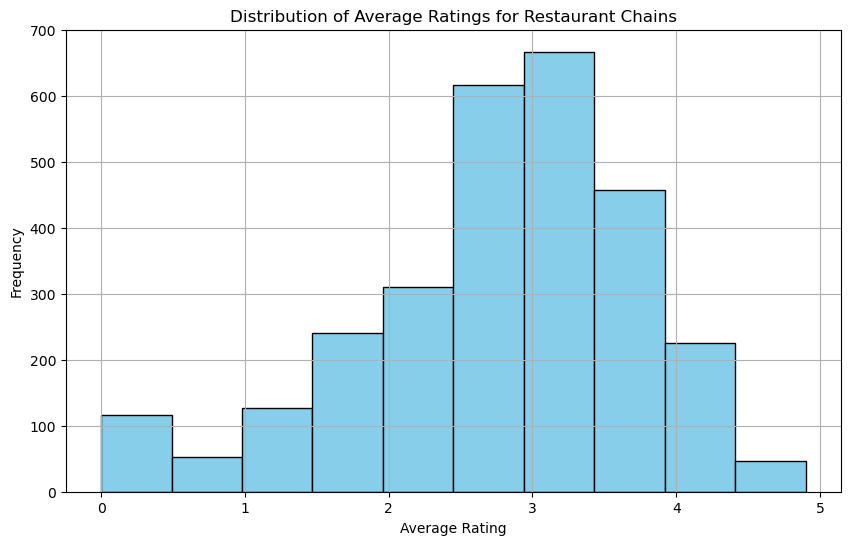

In [68]:
if 'Restaurant Name' in data.columns and 'Aggregate rating' in data.columns:

    data['Restaurant Name'] = data['Restaurant Name'].str.lower()

    name_counts = data['Restaurant Name'].value_counts()

    potential_chains = name_counts[name_counts > 1]

    if not potential_chains.empty:
        print("Potential restaurant chains found:")
        chain_ratings = []
        for chain_name, count in potential_chains.sort_index().items():  
 
            chain_data = data[data['Restaurant Name'] == chain_name]

            # Calculate the average rating for the chain
            avg_rating = chain_data['Aggregate rating'].mean()

            chain_ratings.extend([avg_rating] * count)  # Repeat the average rating based on the count

            print(f"{chain_name.title()} has {count} locations with an average rating of {avg_rating:.2f}")

        # Create a histogram
        plt.figure(figsize=(10, 6))
        plt.hist(chain_ratings, bins=10, edgecolor='black', color='skyblue')
        plt.xlabel('Average Rating')
        plt.ylabel('Frequency')
        plt.title('Distribution of Average Ratings for Restaurant Chains')
        plt.grid(True)
        plt.show()

    else:
        print("No potential restaurant chains found in the dataset.")

else:
    print("The 'Restaurant Name' or 'Aggregate rating' column is not present in the dataset.")